In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

# Importar dataset:

Importamos un dataset de ciudades brasileras al cual le vamos a hacer un análisis.

In [2]:
df = pd.read_csv("BRAZIL_CITIES_REV2022.CSV")
df

,CITY,STATE,CAPITAL,IBGE_RES_POP,IBGE_RES_POP_BRAS,IBGE_RES_POP_ESTR,IBGE_DU,IBGE_DU_URBAN,IBGE_DU_RURAL,IBGE_POP,...,Pu_Bank,Pr_Assets,Pu_Assets,Cars,Motorcycles,Wheeled_tractor,UBER,MAC,WAL-MART,POST_OFFICES
0,Abadia De Goiás,GO,0,6876,6876,0,2137,1546,591,5300,...,0,0,0,2158,1246,0,0,0,0,1
1,Abadia Dos Dourados,MG,0,6704,6704,0,2328,1481,847,4154,...,0,0,0,2227,1142,0,0,0,0,1
2,Abadiânia,GO,0,15757,15609,148,4655,3233,1422,10656,...,1,33724584,67091904,2838,1426,0,0,0,0,3
3,Abaetetuba,PA,0,141100,141040,60,31061,19057,12004,82956,...,4,76181384,800078483,5277,25661,0,0,0,0,2
4,Abaeté,MG,0,22690,22690,0,7694,6667,1027,18464,...,2,44974716,371922572,6928,2953,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5573,Áurea,RS,0,3665,3665,0,1222,548,674,1525,...,2,0,117198141,1435,400,0,0,0,0,1
5574,Ângulo,PR,0,2859,2844,15,929,737,192,2246,...,0,0,0,898,415,0,0,0,0,1
5575,Érico Cardoso,BA,0,10859,10859,0,2659,542,2117,1999,...,0,0,0,655,1020,0,0,0,0,1
5576,Óbidos,PA,0,49333,49324,9,11263,6068,5195,25295,...,3,0,184494811,938,4985,0,0,0,0,1


In [3]:
DeepnoteChart(df, """{"mark":{"type":"bar","tooltip":true},"width":"container","config":{"customFormatTypes":true},"height":"container","$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"},"format":{"type":"default","decimals":null}},"y":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"},"format":{"type":"default","decimals":null}},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear"},"format":{"type":"default","decimals":null}}}}""")

In [4]:
DeepnoteChart(df, """{"layer":[{"layer":[{"mark":{"clip":true,"type":"bar","color":"#4c78a8","tooltip":true},"encoding":{"x":{"sort":null,"type":"nominal","field":"CATEGORIA_TUR","scale":{"type":"linear"}},"y":{"sort":null,"scale":{"type":"linear"}}}}]}],"title":"","config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{}}""")

# Explorar dataset:

Exploramos la data del dataset a través de diversos gráficos.

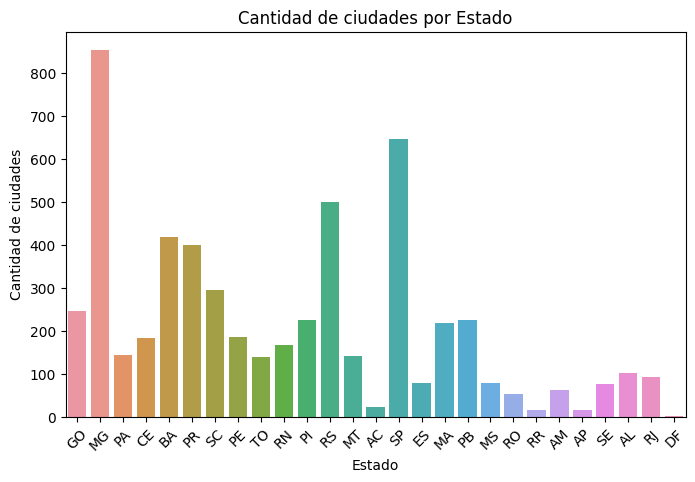

In [5]:
plt.figure(figsize=(8, 5))
sns.countplot(x='STATE', data=df)
plt.xlabel('Estado')
plt.ylabel('Cantidad de ciudades')
plt.title('Cantidad de ciudades por Estado')
plt.xticks(rotation=45)
plt.show()

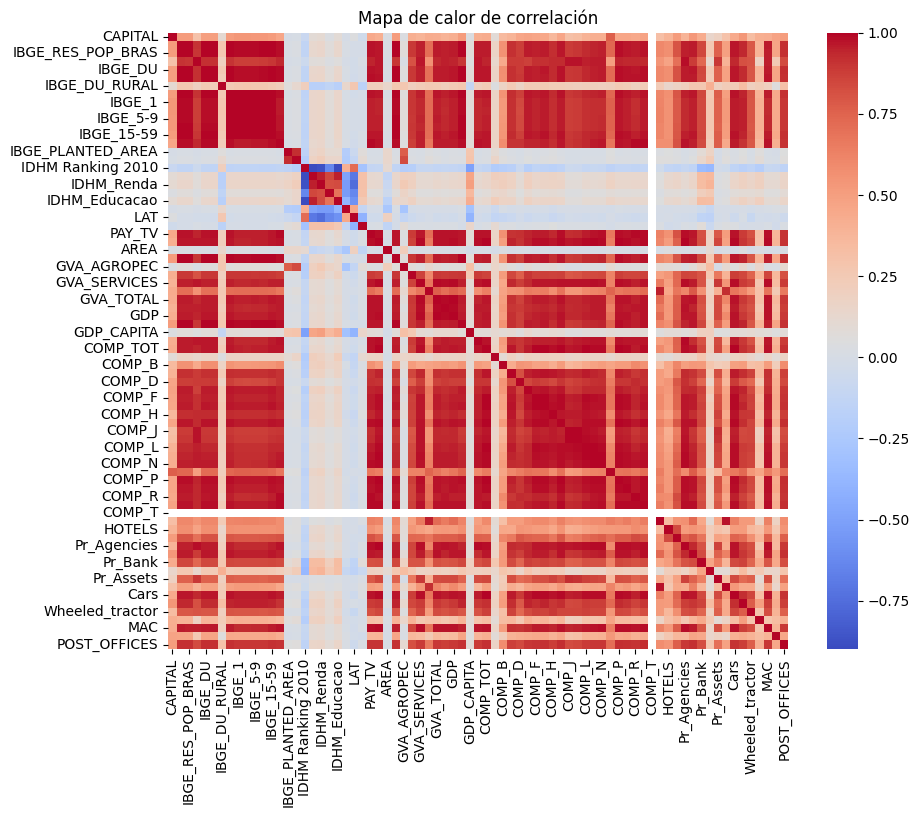

In [6]:
plt.figure(figsize=(10, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Mapa de calor de correlación')
plt.show()

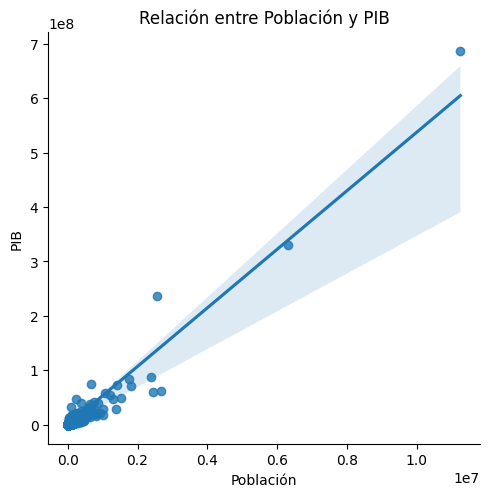

In [7]:
sns.lmplot(x='IBGE_RES_POP', y='GDP', data=df)
plt.xlabel('Población')
plt.ylabel('PIB')
plt.title('Relación entre Población y PIB')
plt.show()

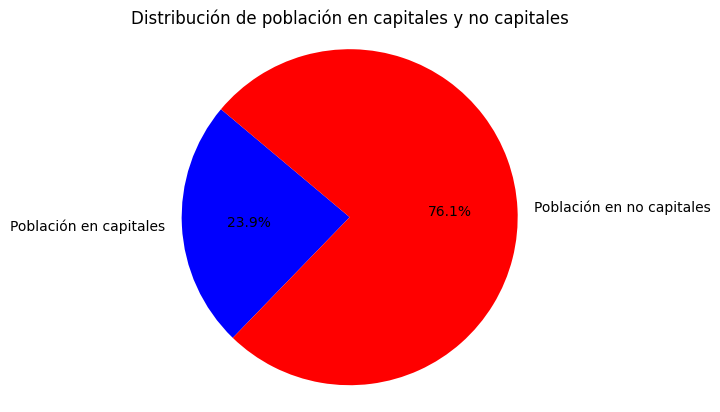

In [8]:
# Calcular la población en capitales y no capitales
poblacion_en_capitales = df[df['CAPITAL'] == 1]['IBGE_RES_POP'].sum()
poblacion_en_no_capitales = df[df['CAPITAL'] == 0]['IBGE_RES_POP'].sum()

# Crear un gráfico de torta
labels = ['Población en capitales', 'Población en no capitales']
sizes = [poblacion_en_capitales, poblacion_en_no_capitales]
colors = ['blue', 'red']

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico de torta sea un círculo

# Mostrar el gráfico
plt.title('Distribución de población en capitales y no capitales')
plt.show()

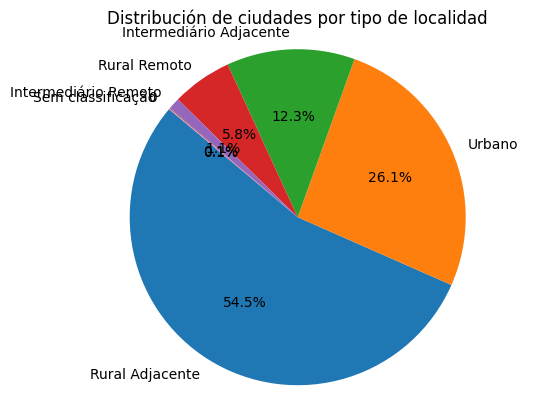

In [9]:
# Contar la cantidad de ciudades en cada categoría
conteo_categorias = df['RURAL_URBAN'].value_counts()

# Crear un gráfico de torta
plt.pie(conteo_categorias, labels=conteo_categorias.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico de torta sea un círculo

# Mostrar el gráfico
plt.title('Distribución de ciudades por tipo de localidad')
plt.show()

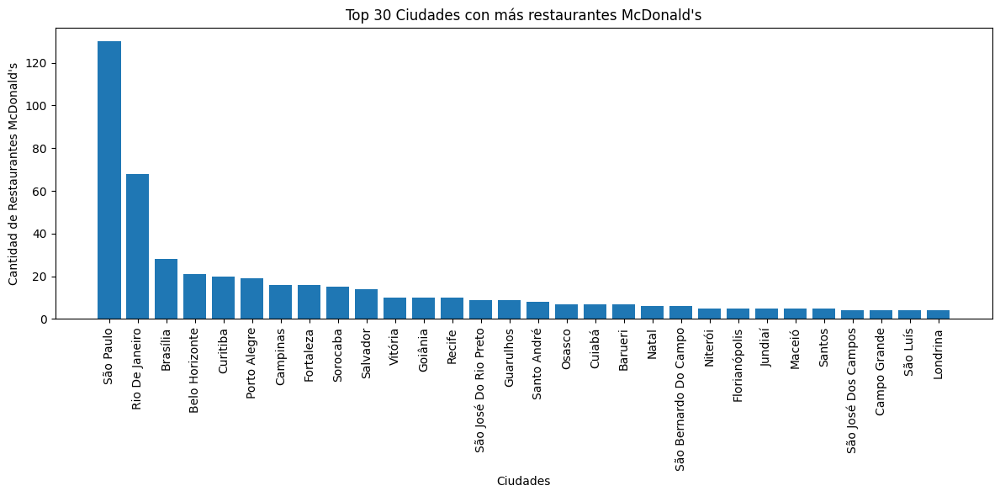

In [10]:
# Ordenar el DataFrame por la columna 'MAC' de manera descendente y tomar las primeras 30 filas
df_top_30 = df.sort_values(by='MAC', ascending=False).head(30)

# Crear un gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df_top_30['CITY'], df_top_30['MAC'])

# Agregar etiquetas y título
plt.xlabel('Ciudades')
plt.ylabel('Cantidad de Restaurantes McDonald\'s')
plt.title('Top 30 Ciudades con más restaurantes McDonald\'s')

# Rotar las etiquetas del eje x para mejor legibilidad
plt.xticks(rotation=90)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

# IAs predictivas:

Vamos a crear IAs que puedan redecir dos atributos del dataset, uno númerico y otro categórico.

Numérico: Cantidad de MacDonald´s

Categórico: Urbano/Rural

Para el atributo numérico a predecir seleccionado vamos a realizar una predicción usando Linear Regresion y Decision Tree Regressor y luego compararemos sus resultados.

In [11]:
# Seleccionar características y etiqueta
X3 = df[['IBGE_RES_POP']]
y3 = df['MAC']

# Entrenar modelo
model = LinearRegression()
model.fit(X3, y3)

# Predecir cantidad de hoteles
y3_pred = model.predict(X3)

# Crear dataframe a partir de la matriz de predicciones
df_pred = pd.DataFrame(y3_pred, columns=["Predicho"])

#cross_val_score
scores1 = np.mean(cross_val_score(model, X3, y3, cv=100))

#KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)
mse_scores1 = []

for train_index, test_index in kf.split(X3):
    X3_train, X3_test = X3.iloc[train_index], X3.iloc[test_index]
    y3_train, y3_test = y3.iloc[train_index], y3.iloc[test_index]
    model.fit(X3_train, y3_train)
    y3_pred = model.predict(X3_test)
    mse_scores1.append(mean_squared_error(y3_test, y3_pred))
scoresKF1 = np.mean(mse_scores1)

#TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)
mse_scores1 = []

for train_index, test_index in tscv.split(X3):
    X3_train, X3_test = X3.iloc[train_index], X3.iloc[test_index]
    y3_train, y3_test = y3.iloc[train_index], y3.iloc[test_index]
    model.fit(X3_train, y3_train)
    y3_pred = model.predict(X3_test)
    mse_scores1.append(mean_squared_error(y3_test, y3_pred))
scoresTSCV1 = np.mean(mse_scores1)

comparacion = pd.DataFrame()
comparacion['y'] = y3_test
comparacion['y_pred'] = y3_pred
comparacion


,y,y_pred
4649,0,0.005829
4650,0,-0.066427
4651,0,-0.121970
4652,0,-0.038396
4653,0,0.116048
...,...,...
5573,0,-0.140283
5574,0,-0.147142
5575,0,-0.079064
5576,0,0.248341


In [12]:
# Seleccionar características y etiqueta
X4 = df[['IBGE_RES_POP']]
y4 = df['MAC']

# Entrenar modelo
model = DecisionTreeClassifier(max_depth=5, min_samples_leaf=5)
model.fit(X4, y4)

# Predecir si es capital o no
y4_pred = model.predict(X4)

# Eliminar filas con valores faltantes en las predicciones del modelo
y4_pred = y4_pred[y4.notnull()]

#cross_val_score
scores2 = np.mean(cross_val_score(model, X4, y4, cv=100))

#KFold
mse_scores2 = []

for train_index, test_index in kf.split(X4):
    X4_train, X4_test = X4.iloc[train_index], X4.iloc[test_index]
    y4_train, y4_test = y4.iloc[train_index], y4.iloc[test_index]
    model.fit(X4_train, y4_train)
    y4_pred = model.predict(X4_test)
    mse_scores2.append(mean_squared_error(y4_test, y4_pred))
scoresKF2 = np.mean(mse_scores2)

#TimesSeriesSplit
mse_scores2 = []

for train_index, test_index in tscv.split(X4):
    X4_train, X4_test = X4.iloc[train_index], X4.iloc[test_index]
    y4_train, y4_test = y4.iloc[train_index], y4.iloc[test_index]
    model.fit(X4_train, y4_train)
    y4_pred = model.predict(X4_test)
    mse_scores2.append(mean_squared_error(y4_test, y4_pred))
scoresTSCV2 = np.mean(mse_scores2)

comparacion2 = pd.DataFrame()
comparacion2['y'] = y4_test
comparacion2['y_pred'] = y4_pred
comparacion2

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=100.
  warnings.warn(


,y,y_pred
4649,0,0
4650,0,0
4651,0,0
4652,0,0
4653,0,0
...,...,...
5573,0,0
5574,0,0
5575,0,0
5576,0,0


Comparamos los modelos:

In [13]:
print("Puntos regresión lineal: ", scores1)
print("Puntos árbol de decisión: ", scores2)

Puntos regresión lineal:  -0.9035581454539361
Puntos árbol de decisión:  0.9679577922077924


En este caso ganó el árbol de decisión porque el promedio del cross_val_score se acerca más a 1.

Ahora haremos lo mismo con el atributo categórico:

In [14]:
# Seleccionar características y etiqueta
X5 = df[['IBGE_RES_POP']]
y5 = df['CAPITAL']

# Entrenar modelo
model = LinearRegression()
model.fit(X5, y5)

# Predecir cantidad de hoteles
y5_pred = model.predict(X5)

# Crear dataframe a partir de la matriz de predicciones
df_pred = pd.DataFrame(y5_pred, columns=["Predicho"])

#cross_val_score
scores3 = np.mean(cross_val_score(model, X5, y5, cv=100))

#KFold
mse_scores3 = []

for train_index, test_index in kf.split(X5):
    X5_train, X5_test = X5.iloc[train_index], X5.iloc[test_index]
    y5_train, y5_test = y5.iloc[train_index], y5.iloc[test_index]
    model.fit(X5_train, y5_train)
    y5_pred = model.predict(X5_test)
    mse_scores3.append(mean_squared_error(y5_test, y5_pred))
scoresKF3 = np.mean(mse_scores3)

#TimesSeriesSplit
mse_scores3 = []

for train_index, test_index in tscv.split(X5):
    X5_train, X5_test = X5.iloc[train_index], X5.iloc[test_index]
    y5_train, y5_test = y5.iloc[train_index], y5.iloc[test_index]
    model.fit(X5_train, y5_train)
    y5_pred = model.predict(X5_test)
    mse_scores3.append(mean_squared_error(y5_test, y5_pred))
scoresTSCV3 = np.mean(mse_scores3)

comparacion3 = pd.DataFrame()
comparacion3['y'] = y5_test
comparacion3['y_pred'] = y5_pred
comparacion3

,y,y_pred
4649,0,0.002504
4650,0,-0.000211
4651,0,-0.002298
4652,0,0.000842
4653,0,0.006646
...,...,...
5573,0,-0.002986
5574,0,-0.003244
5575,0,-0.000686
5576,0,0.011617


In [15]:
# Eliminar filas con valores faltantes
df = df.dropna()

# Seleccionar características y etiqueta
X6 = df[['IBGE_RES_POP', 'AREA']]
y6 = df['CAPITAL']

# Entrenar modelo
model = DecisionTreeClassifier(max_depth=5, min_samples_leaf=5)
model.fit(X6, y6)

# Predecir si es capital o no
y6_pred = model.predict(X6)

# Eliminar filas con valores faltantes en las predicciones del modelo
y6_pred = y6_pred[y6.notnull()]

#cross_val_score
scores4 = np.mean(cross_val_score(model, X6, y6, cv=100))

#KFold
mse_scores4 = []

for train_index, test_index in kf.split(X5):
    X6_train, X6_test = X6.iloc[train_index], X6.iloc[test_index]
    y6_train, y6_test = y6.iloc[train_index], y6.iloc[test_index]
    model.fit(X6_train, y6_train)
    y6_pred = model.predict(X6_test)
    mse_scores4.append(mean_squared_error(y6_test, y6_pred))
scoresKF4 = np.mean(mse_scores4)

#TimesSeriesSplit
mse_scores4 = []

for train_index, test_index in tscv.split(X5):
    X6_train, X6_test = X6.iloc[train_index], X6.iloc[test_index]
    y6_train, y6_test = y6.iloc[train_index], y6.iloc[test_index]
    model.fit(X6_train, y6_train)
    y6_pred = model.predict(X6_test)
    mse_scores4.append(mean_squared_error(y6_test, y6_pred))
scoresTSCV4 = np.mean(mse_scores4)

comparacion2 = pd.DataFrame()
comparacion2['y'] = y6_test
comparacion2['y_pred'] = y6_pred
comparacion2

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_split.py:684: UserWarning: The least populated class in y has only 33 members, which is less than n_splits=100.
  warnings.warn(


,y,y_pred
4649,0,0
4650,0,0
4651,0,0
4652,0,0
4653,0,0
...,...,...
5573,0,0
5574,0,0
5575,0,0
5576,0,0


Comparamos:

In [16]:
print("Puntos regresión lineal: ", scores3)
print("Puntos árbol de decisión: ", scores4)

Puntos regresión lineal:  0.011087815546571803
Puntos árbol de decisión:  0.9953506493506492


De vuelta el árbol de decisión es el ganador.

En vez de usar cross_val_score probemos usar otros metodos de validación cruzada. Usemos KFold:

In [17]:
print("Puntos regresión lineal - McDonald's: ", scoresKF1)
print("Puntos árbol de decisión - McDonald's: ", scoresKF2)
print("Puntos regresión lineal - Capital: ", scoresKF3)
print("Puntos árbol de decisión - Capital: ", scoresKF4)

Puntos regresión lineal - McDonald's:  0.5606975796763407
Puntos árbol de decisión - McDonald's:  3.3938086053650927
Puntos regresión lineal - Capital:  0.005195426358833006
Puntos árbol de decisión - Capital:  0.005378272819325907


Ahora usemos TimesSeriesSplit

In [19]:
print("Puntos regresión lineal - McDonald's: ", scoresTSCV1)
print("Puntos árbol de decisión - McDonald's: ", scoresTSCV2)
print("Puntos regresión lineal - Capital: ", scoresTSCV3)
print("Puntos árbol de decisión - Capital: ", scoresTSCV4)

Puntos regresión lineal - McDonald's:  0.5990654637678686
Puntos árbol de decisión - McDonald's:  4.206889128094725
Puntos regresión lineal - Capital:  0.004914977016015047
Puntos árbol de decisión - Capital:  0.003659849300322928


La gran ventaja de cross_val_score es que se puede implementar con pocas líneas de código, a diferencia de las otras dos. La ventaja que tienen las otras dos, es que aunque requieren más código son más flexibles y se puede controlar más como se dividen los datos. También, TimesSeriesSplit funciona mejor en series temporales. 

# Conclusión:

Como conclusión final, podemos darnos cuenta que las IAs no son perfectas y que hay varios tipos cada una con sus ventajas y desventajas, y que no se puede crear una IA capaz de hacer predicciones iguales o mejores que un ser humano con unas pocas líneas de código. También vimos que al igual que las propias IAs, las formas de evaluar sus predicciones son igual de imperfectas y existen varios tipos con sus ventajas y desventajas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=3f3ef454-403b-4dde-8e1f-0348d5c579a8' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>